# ePSproc with polarization state control
15/03/24

In the [basic demo docs](ePSproc_class_demo_161020.html), MF-PADs are illustrated for the default case: linear polarization and $(x,y,z)$ polarization geometry relative to the $z$-axis, as defined by the molecular symmetry axis. In this notebook, further examples of polarization state creation and control are given.

For further details see also:

- [Frame definition docs](../special_topics/frame_definitions_docs_130323.html) (includes more info on frame definitions and polarization states, plus frame rotations).
- [Epol class demo](Epol_class_demo_docs_030324-tidy.html), more details of the `EfieldPol` class for generating E-fields with arb polarization states, as used herein.

## Molecular frame example ($N_2$)

Quick demo as per the [main class intro docs](ePSproc_class_demo_161020.html).

### Import matrix elements

In [1]:
# Import
import epsproc as ep  
from pathlib import Path

# Set data path
# Note this is set here from ep.__path__, but may not be correct in all cases - depends on where the Github repo is.
epDemoDataPath = Path(ep.__path__[0]).parent/'data'
dataPath = epDemoDataPath/'photoionization'/'n2_multiorb'


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


* sparse not found, sparse matrix forms not available. 
* natsort not found, some sorting functions not available. 


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


* Set Holoviews with bokeh.
* pyevtk not found, VTK export not available. 


In [2]:
# Class dev code
from epsproc.classes.multiJob import ePSmultiJob
from epsproc.classes.base import ePSbase

# Instantiate class object.
# Minimally this needs just the dataPath, if verbose = 1 is set then some useful output will also be printed.
data = ePSbase(dataPath, verbose = 1)

# ScanFiles() - this will look for data files on the path provided, and read from them.
data.scanFiles()


*** Job orb6 details
Key: orb6
Dir /home/jovyan/github/ePSproc/data/photoionization/n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_1pu_0.1-50.1eV, orbital A2',
    'event': ' N2 A-state (1piu-1)',
    'orbE': -17.09691397835426,
    'orbLabel': '1piu-1'}

*** Job orb5 details
Key: orb5
Dir /home/jovyan/github/ePSproc/data/photoionization/n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_3sg_0.1-50.1eV, orbital A2',
    'event': ' N2 X-state (3sg-1)',
    'orbE': -17.34181645456815,
    'orbLabel': '3sg-1'}


*** Molecular structure


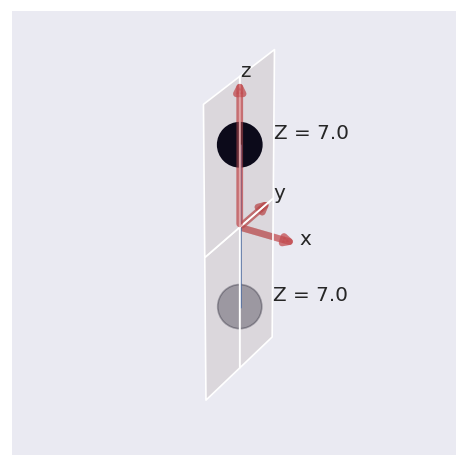


*** Molecular orbital list (from ePS output file)
EH = Energy (Hartrees), E = Energy (eV), NOrbGrp, OrbGrp, GrpDegen = degeneracies and corresponding orbital numbering by group in ePS, NormInt = single centre expansion convergence (should be ~1.0).


props,Sym,EH,Occ,E,NOrbGrp,OrbGrp,GrpDegen,NormInt
orb,,,,,,,,
1,SG,-15.6719,2.0,-426.454124,1.0,1.0,1.0,0.999532
2,SU,-15.6676,2.0,-426.337115,1.0,2.0,1.0,0.999458
3,SG,-1.4948,2.0,-40.675580,1.0,3.0,1.0,0.999979
4,SU,-0.7687,2.0,-20.917393,1.0,4.0,1.0,0.999979
5,SG,-0.6373,2.0,-17.341816,1.0,5.0,1.0,1.000000
6,PU,-0.6283,2.0,-17.096914,1.0,6.0,2.0,1.000000
7,PU,-0.6283,2.0,-17.096914,2.0,6.0,2.0,1.000000


In [3]:
# Plot molecule
data.molSummary()

### Set polarization state(s) and polarization geometries

For simplicity, use the `EfieldPol` class (see the [Epol class demo](Epol_class_demo_docs_030324-tidy.html) for more info). This provides a quick method to set fields in the $E_{x,y}$, and $E_{l,r}$ basis, and additionally wraps frame rotation functions.

In [4]:
from epsproc.efield.epol import EfieldPol
import numpy as np

# Create some fields
# Linear pol defined as (Ex,Ey)
Exy = EfieldPol(Exy=[1,0])

# Define circ pol fields (max and min ellipticity)
ERCP = EfieldPol(ell=[1,0,np.pi/4])
ELCP = EfieldPol(ell=[1,0,-np.pi/4])

# Define arb ellipticity and rotations, format = [amplitude,azimuth (0,pi), ellipticity (-pi/4,pi/4)]
ellipticity = 0.5*np.pi/4
Eell_mixed = EfieldPol(ell=[1,0,ellipticity])
Eell_rotated = EfieldPol(ell=[1,np.pi/3,ellipticity])

# Mulitple ellipticities and rotations
states = 10
# angles = np.linspace(0, np.pi, states)  # For range of angles
angles = np.zeros(states)  # no rotation
ellipticities = np.linspace(0,np.pi/4, states)
ell = np.c_[np.ones(states),angles,ellipticities]
labels = (ellipticities/(np.pi/4) * 100).round(2)  # Set labels at %age ellipticity
Eell_multi = EfieldPol(ell=ell, labels = labels)

# Set all pol states above in a dictionary
polStateList = [k for k in locals().keys() if k.startswith('E') and k != 'EfieldPol']

# Set dict of EfieldPol objects
polStateDict = {}
for k in polStateList:
    polStateDict[k] = locals()[k]

Set field from Exy.
[[1. 0.]]
Set field from ell.
[[1.         0.         0.78539816]]
Set field from ell.
[[ 1.          0.         -0.78539816]]
Set field from ell.
[[1.         0.         0.39269908]]
Set field from ell.
[[1.         1.04719755 0.39269908]]
Set field from ell.
[[1.         0.         0.        ]
 [1.         0.         0.08726646]
 [1.         0.         0.17453293]
 [1.         0.         0.26179939]
 [1.         0.         0.34906585]
 [1.         0.         0.43633231]
 [1.         0.         0.52359878]
 [1.         0.         0.61086524]
 [1.         0.         0.6981317 ]
 [1.         0.         0.78539816]]


In [5]:
Eell_multi.labels

array([  0.  ,  11.11,  22.22,  33.33,  44.44,  55.56,  66.67,  77.78,
        88.89, 100.  ])

[None, None, None, None, None, None]

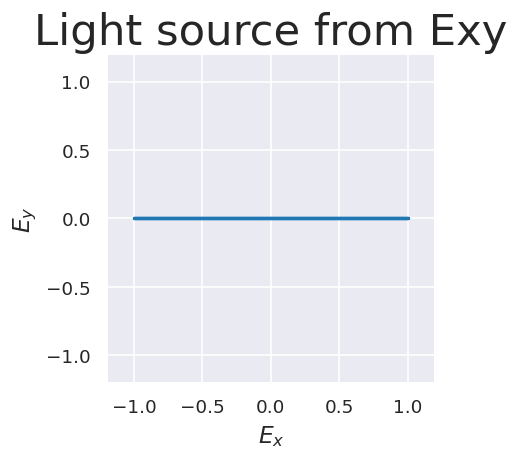

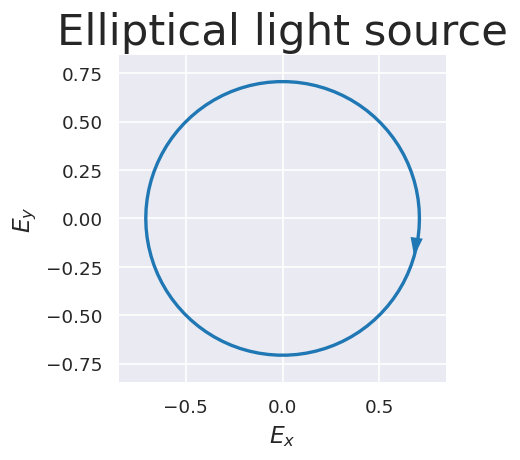

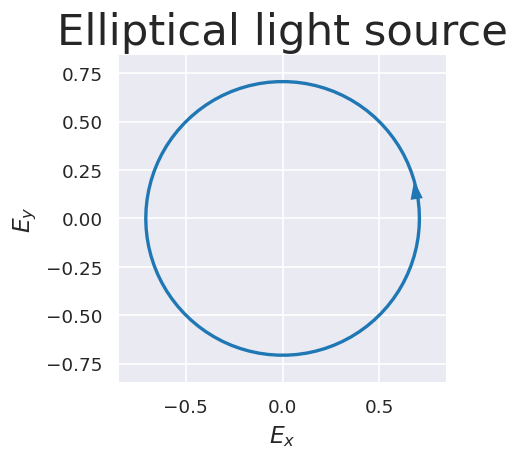

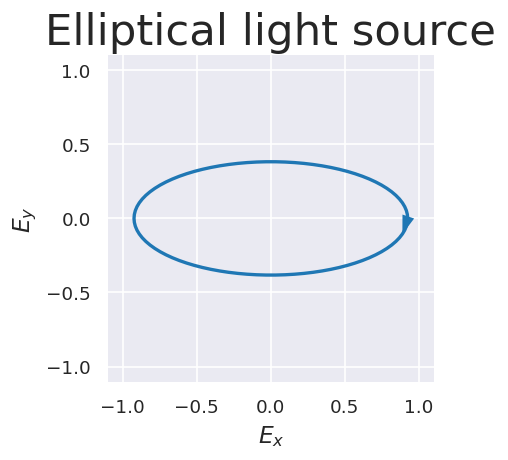

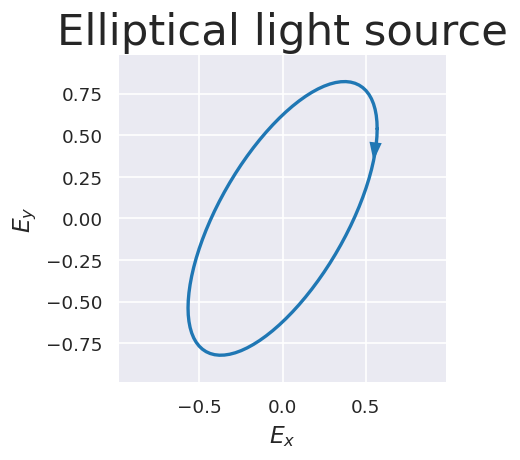

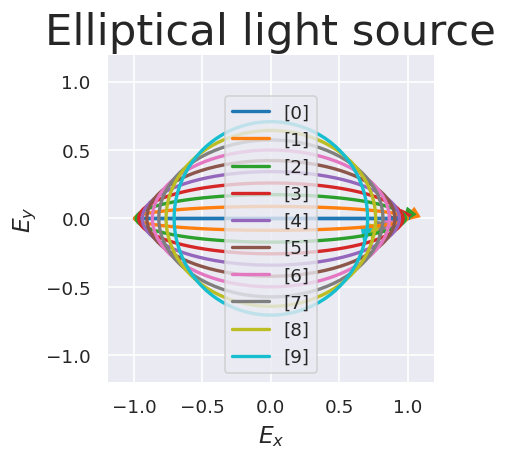

In [6]:
# Each e-field object has some attached methods, for this demo access them via a dictionary
# item.plot() is available if the py_pol library is installed.
# item.plotSph() is always available

# Plot all pol states
[item.plot(figsize=(4,4)) for k,item in polStateDict.items()]

### Compute MF results

The main MFBLM class routine will accept either an `EfieldPol` object, or the dictionary `self.epDict`, which contains the parameters required by the MFBLM() calculation. In the former case, default configuration options will be applied if missing, or can be set manually for additional control. If multiple polarization states are present in the `EfieldPol` object, calculations will be run for all pol states (see demo below).

**Known issue**: for some cases low cross-sections may result in unphysical $\beta_{L,M}$ results. These currently require manual checking of the corss-sections, but will be automatically flagged/filtered in future.  See [issue #76 for updates](https://github.com/phockett/ePSproc/issues/76).

In [7]:
# Set input field(s) as class instance
Einput = Eell_rotated

# Two options:
# (1) Use Epol class object as Einput, this will run for default config options if not set
data.MFBLM(EfieldPol = Einput)


# # (2) Manually configure then pass either object or self.epDict to be passed.
# # Set params for MFBLM calculation
# Einput.setep()
# Einput.setOrientation()  # To ensure frame settings for Epol, run self.setOrientation.
#                          # Otherwise MFBLM computation will use defaults.
# Einput.calcEPR(labels = ellipticities.round(2)) # For multi-pol case also need calcEPR, but can skip for single pol case.
#                                                 # Set labels for additional control
# data.MFBLM(EfieldPol = Einput)  # Pass with updated object

# # Can also run as per older style with dict passing
# data.MFBLM(**Einput.epDict)  # Pass via self.epDict


Calculating MF-BLMs for job key: orb6
Set parameters to `self.epDict` and `self.epXR`.
Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.
Set orientations to self.epDict['RX'].

Calculating MF-BLMs for job key: orb5


Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb5][MFBLM], facetDims=['Eke', 'Labels'], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-2.440693579175965-0.18527562237567477j). This may be unphysical and/or result in plotting issues.


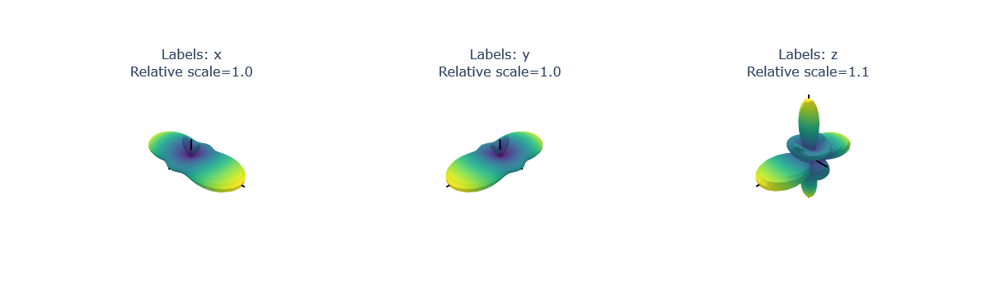

Set plot to self.data['orb5']['plots']['MFBLM']['polar']


In [8]:
# Plot some MF-PADs with Plotly backend
# data.BLMplot(dataType='MFBLM', thres = 1e-2, backend='hv', Erange=[0,15], ylim=(-1.5, 2.5), width=800)
data.padPlot(keys = 'orb5', Erange = [8, 10, 4], dataType='MFBLM',
             nCols = 5, backend='pl', returnFlag=True)

In [9]:
# Plot BLM parameters
# Note this may be quite slow for large results sets
data.BLMplot(dataType='MFBLM', thres = 1e-2, backend='hv', width=700,  ylim=(-1.5, 2.5), xlim=(0,15))

BLMplot set data and plots to self.plots['BLMplot']


:HoloMap   [Orb,Labels]
   :NdOverlay   [l,m]
      :Curve   [Eke]   (BLM)

True

### Compute MF results for a range of polarizations and compare

For direct comparison of states, a single MFPAD run can be performed with a pre-defined set of fields defined by the input field (or `EPR` tensor) terms. The method is essentially as for a single field, except that some additional plotting arguments may be required to handle the additional dimension in the results (defaults to name `pol`).

In [10]:
# Set input field(s) as class instance
Einput = Eell_multi

# Two options:
# (1) Use Epol class object as Einput, this will run for default config options if not set
data.MFBLM(EfieldPol = Einput)


# # (2) Manually configure then pass either object or self.epDict to be passed.
# # Set params for MFBLM calculation
# Einput.setep()
# Einput.setOrientation()  # To ensure frame settings for Epol, run self.setOrientation.
#                          # Otherwise MFBLM computation will use defaults.
# Einput.calcEPR(labels = ellipticities.round(2)) # For multi-pol case also need calcEPR, but can skip for single pol case.
#                                                 # Set labels for additional control
# data.MFBLM(EfieldPol = Einput)  # Pass with updated object

# # Can also run as per older style with dict passing
# data.MFBLM(**Einput.epDict)  # Pass via self.epDict


Calculating MF-BLMs for job key: orb6
Set parameters to `self.epDict` and `self.epXR`.
Set pol state data to self.YLM and self.YLMrot, and orientations to self.RX.
Set orientations to self.epDict['RX'].
Set geomCalc.EPR() results to `self.EPRX`.

Calculating MF-BLMs for job key: orb5


Using default sph betas.
Summing over dims: set()
Plotting from self.data[orb5][MFBLM], facetDims=['Eke', 'pol'], pType=a with backend=pl.
*** WARNING: plot dataset has min value < 0, min = (-3.341508000902801-0.26014544128014244j). This may be unphysical and/or result in plotting issues.


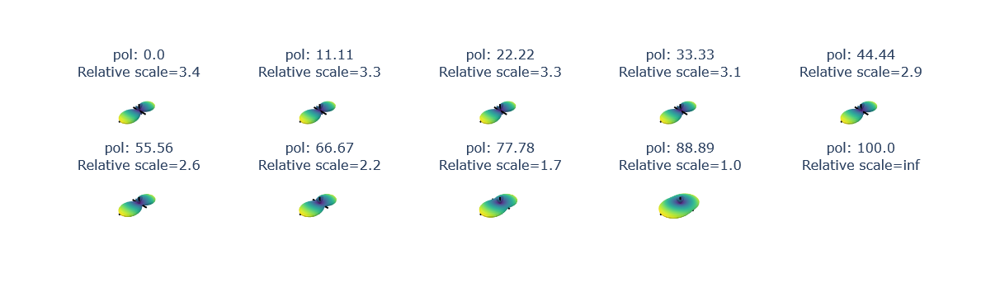

Set plot to self.data['orb5']['plots']['MFBLM']['polar']


In [20]:
# Plot some MF-PADs with Plotly backend, selected by pol geometry and shown by pol state/type
# data.BLMplot(dataType='MFBLM', thres = 1e-2, backend='hv', Erange=[0,15], ylim=(-1.5, 2.5), width=800)
data.padPlot(keys = 'orb5', Erange = [8, 10, 4], dataType='MFBLM', 
             facetDims=['Eke', 'pol'], selDims = {'Labels':'x'},
             nCols = 5, backend='pl', returnFlag=True)  #, width=1200, height=1200)

In [12]:
# Plot BLM parameters
# Note this may be quite slow for large results sets
data.BLMplot(dataType='MFBLM', thres = 1e-2, backend='hv', width=700,  ylim=(-1.5, 2.5), xlim=(0,15))

BLMplot set data and plots to self.plots['BLMplot']


:HoloMap   [Orb,pol,Labels]
   :NdOverlay   [l,m]
      :Curve   [Eke]   (BLM)

True

In [13]:
# Plot BLM parameters - VERSUS POL STATE
# Note this may be quite slow for large results sets
# To speed up pass subselection options to plotter, or replot (see next cell).
data.BLMplot(dataType='MFBLM', xDim='pol', Erange=[0,10], thres = 1e-2, backend='hv', width=700,  ylim=(-1.5, 2.5)) #, xlim=(0,15))

BLMplot set data and plots to self.plots['BLMplot']


:HoloMap   [Orb,Labels,Eke]
   :NdOverlay   [l,m]
      :Curve   [pol]   (BLM)

True

In [14]:
# Example with post-plotter subselection for faster plotting...

# Create HV object, but don't plot
data.BLMplot(dataType='MFBLM', xDim='pol', thres = 1e-2, backend='hv', width=700,  ylim=(-1.5, 2.5), 
             renderPlot=False)

# Replot from Holoviews dataset with selectors
# Note this may need hv or hvPlotters to be loaded
from epsproc.plot import hvPlotters
xDim = 'pol'
data.plots['BLMplot']['hvDS'].select(Eke=[1.1,10.1,20.1]).select(Orb='orb5').to(hvPlotters.hv.Curve, kdims=xDim).overlay(['l', 'm'])

BLMplot set data and plots to self.plots['BLMplot']


:HoloMap   [Orb,Labels,Eke]
   :NdOverlay   [l,m]
      :Curve   [pol]   (BLM)

## Compute LF and AF results

In progress March 2024.

## Versions

In [15]:
import scooby
scooby.Report(additional=['epsproc', 'holoviews', 'hvplot', 'xarray', 'matplotlib', 'bokeh', 'plotly'])

--------------------------------------------------------------------------------
  Date: Wed Mar 20 12:19:18 2024 EDT

                OS : Linux
            CPU(s) : 64
           Machine : x86_64
      Architecture : 64bit
               RAM : 62.8 GiB
       Environment : Jupyter
       File system : btrfs

  Python 3.10.11 | packaged by conda-forge | (main, May 10 2023, 18:58:44)
  [GCC 11.3.0]

           epsproc : 1.3.2-dev
         holoviews : 1.16.2
            hvplot : 0.8.4
            xarray : 2022.3.0
        matplotlib : 3.5.3
             bokeh : 3.1.1
            plotly : 5.15.0
             numpy : 1.23.5
             scipy : 1.10.1
           IPython : 8.13.2
            scooby : 0.7.2
--------------------------------------------------------------------------------

In [16]:
# Check current Git commit for local ePSproc version
from pathlib import Path
!git -C {Path(ep.__file__).parent} branch
!git -C {Path(ep.__file__).parent} log --format="%H" -n 1

* 3d-AFPAD-dev
565448918fb2dfcb8b5860b0174f5711d85edd2c


In [17]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/ePSproc

565448918fb2dfcb8b5860b0174f5711d85edd2c	refs/heads/3d-AFPAD-dev
7e4270370d66df44c334675ac487c87d702408da	refs/heads/dev
1c0b8fd409648f07c85f4f20628b5ea7627e0c4e	refs/heads/master
69cd89ce5bc0ad6d465a4bd8df6fba15d3fd1aee	refs/heads/numba-tests
ea30878c842f09d525fbf39fa269fa2302a13b57	refs/heads/revert-9-master
baf0be0c962e8ab3c3df57c8f70f0e939f99cbd7	refs/heads/testDev
